In [1]:
import cv2
import numpy as np

In [2]:
import matplotlib.pyplot as plt

In [3]:
def preprocess_y(img):
    result = []
    
    for i in img:
        result.append([])
        for j in i:
            result[-1].append(1 if sum(j) <= 6 else 0)
            
    result = np.array(result)
    return result

In [4]:
y_img = cv2.cvtColor(cv2.imread("./y/(4).png"), cv2.COLOR_BGR2RGB)

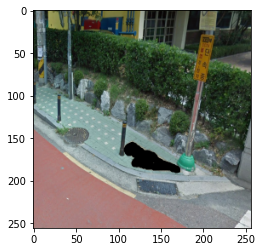

In [5]:
plt.imshow(y_img)

(256, 256)


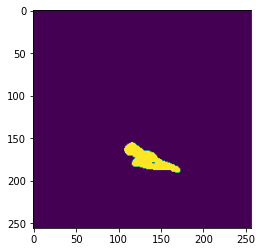

In [6]:
preprocess_ = preprocess_y(y_img)
print(preprocess_.shape)
plt.imshow(preprocess_)

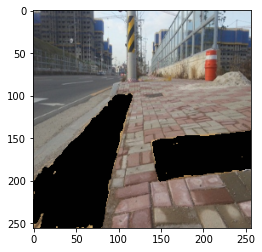

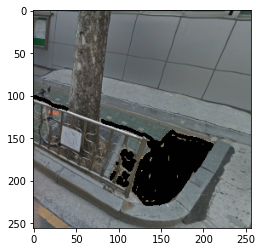

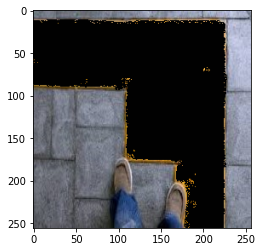

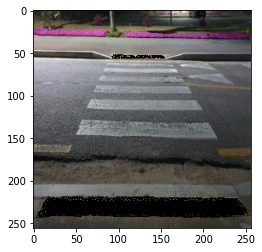

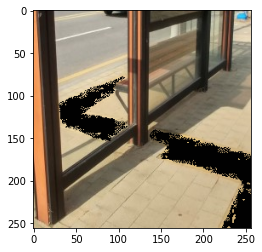

...

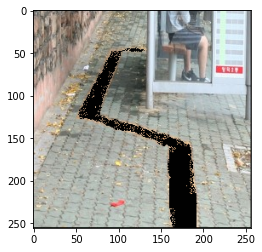

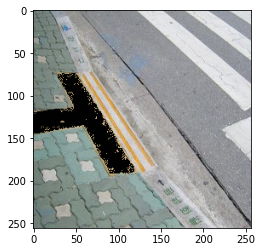

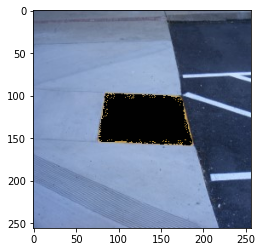

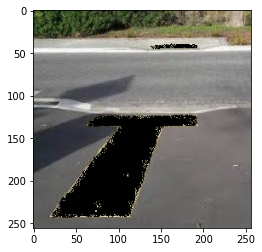

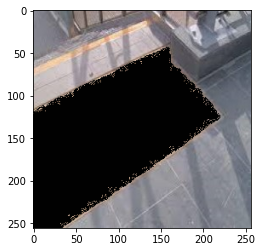

In [7]:
from os import listdir

for x_path, y_path in zip(sorted(listdir("./x/")), sorted(listdir("./y/"))):
    y_img = cv2.cvtColor(cv2.imread("./y/" + y_path), cv2.COLOR_BGR2RGB)
    preprocess_ = preprocess_y(y_img)
    
    x_img = cv2.cvtColor(cv2.imread("./x/" + x_path), cv2.COLOR_BGR2RGB)
    
    for i in range(256):
        for j in range(256):
            if preprocess_[i][j] == 1:
                x_img[i][j] = (1, 1, 1)
    
    plt.imshow(x_img)
    plt.show()

In [8]:
train_x = []
train_y = []

for x_path, y_path in zip(sorted(listdir("./x/")), sorted(listdir("./y/"))):
    x_img = cv2.cvtColor(cv2.imread("./x/" + x_path), cv2.COLOR_BGR2RGB)
    y_img = preprocess_y(cv2.cvtColor(cv2.imread("./y/" + y_path), cv2.COLOR_BGR2RGB))
    
    x_img = np.transpose(x_img)
    y_img = np.transpose(y_img)
    
    train_x.append(x_img)
    train_y.append(np.array([y_img]))

In [9]:
train_x, train_y = np.array(train_x), np.array(train_y)
print(train_x.shape, train_y.shape)

(101, 3, 256, 256) (101, 1, 256, 256)


In [13]:
np.save("./tactile_train_x.npy", train_x)
np.save("./tactile_train_y.npy", train_y)